# Adding fish detection to the pipeline

As a very low effort pilot, use [a pre-trained fish detection model](https://github.com/rocapal/fish_detection) that's based on YOLOv3 to label my own photos.

# TODO

* Move ~/Desktop images to /data/demo and the result JSON to a more useful place (within the data dir?)
* Do the same for Eviota
* Run cropping on Eviota & demo with a consistent output
* Run prediction on the Eviota crops and evaluate results at different confidence levels, with and without location
* Start using Cogram
* Check that the Darknet params make sense (`-i 0`?)
* Document & tidy up the notebook
* Make an issue with next steps: probably a better detector and more solid pipeline; potentially apply detector in training as well; add CLI for batch-mode cropping and labelling of trip photos

## One-off setup

```
# Clone the repos
$ cd ~/projects
$ git clone git@github.com:rocapal/fish_detection.git
$ cd fish_detection
$ git clone git@github.com:AlexeyAB/darknet

# Build Darknet with GPU (about x100 speedup in detection time
$ cd darknet
$ vi Makefile  # set GPU=1 and OPENCV=1
$ make
$ cd ..

# Get the pretrained model and setup the data files, skipping train.txt since we're not really training
$ wget https://www.dropbox.com/s/gmw2774nrsw7ovk/yolov3-obj_30000.weights
$ mkdir data-fish; cd data-fish/
$ echo "fish" > obj.names
$ echo "classes= 1
train  = data-fish/train.txt
valid  = data-fish/train.txt 
names = data-fish/obj.names
backup = backup/" > obj.data
```

In [212]:
import json

from matplotlib import pyplot as plt
import pandas as pd
from PIL import Image, ImageDraw

%config InlineBackend.figure_format = 'retina'

In [5]:
%%bash

cd ~/projects/fish_detection
ls ~/Desktop/*.JPG | \
    ./darknet/darknet detector test \
        data-fish/obj.data yolov3-obj.cfg yolov3-obj_30000.weights \
        -thresh 0.01 -i 0 -ext_output -dont_show -out results.json

net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
Create CUDA-stream - 0 

 seen 64, trained: 1920 K-images (30 Kilo-batches_64) 
Enter Image Path:  Detection layer: 82 - type = 28 
 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/home/yanir/Desktop/P6204455.JPG: Predicted in 192.297000 milli-seconds.
fish: 100%	(left_x: 1324   top_y:  264   width: 1198   height: 2418)
fish: 1%	(left_x: 2005   top_y: 2694   width:   49   height:   80)
Enter Image Path:  Detection layer: 82 - type = 28 
 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/home/yanir/Desktop/P6204469.JPG: Predicted in 49.076000 milli-seconds.
fish: 100%	(left_x:   79   top_y: 1449   width:  580   height:  282)
fish: 92%	(left_x: 1106   top_y:  966   width:  259   height:  121)
fish: 90%	(left_x: 1684   top_y: 1367   width:  256   height:  150)
fish: 95%	(left_x: 1927   top_y:  979   width:  253   height:  330)
fish: 100%	(left_x: 1944   top_y:  414   wi

 CUDA-version: 10010 (11020), GPU count: 1  
 OpenCV version: 4.2.0
Cannot load image data/labels/32_0.png
Cannot load image data/labels/33_0.png
Cannot load image data/labels/34_0.png
Cannot load image data/labels/35_0.png
Cannot load image data/labels/36_0.png
Cannot load image data/labels/37_0.png
Cannot load image data/labels/38_0.png
Cannot load image data/labels/39_0.png
Cannot load image data/labels/40_0.png
Cannot load image data/labels/41_0.png
Cannot load image data/labels/42_0.png
Cannot load image data/labels/43_0.png
Cannot load image data/labels/44_0.png
Cannot load image data/labels/45_0.png
Cannot load image data/labels/46_0.png
Cannot load image data/labels/47_0.png
Cannot load image data/labels/48_0.png
Cannot load image data/labels/49_0.png
Cannot load image data/labels/50_0.png
Cannot load image data/labels/51_0.png
Cannot load image data/labels/52_0.png
Cannot load image data/labels/53_0.png
Cannot load image data/labels/54_0.png
Cannot load image data/labels/55_0.

In [32]:
!cat '/home/yanir/projects/fish_detection/results.json'

[
{
 "frame_id":1, 
 "filename":"/home/yanir/Desktop/P6204455.JPG", 
 "objects": [ 
  {"class_id":0, "name":"fish", "relative_coordinates":{"center_x":0.480839, "center_y":0.491156, "width":0.299516, "height":0.806030}, "confidence":0.998644}, 
  {"class_id":0, "name":"fish", "relative_coordinates":{"center_x":0.507326, "center_y":0.911161, "width":0.012350, "height":0.026525}, "confidence":0.011210}
 ] 
}, 
{
 "frame_id":2, 
 "filename":"/home/yanir/Desktop/P6204469.JPG", 
 "objects": [ 
  {"class_id":0, "name":"fish", "relative_coordinates":{"center_x":0.743633, "center_y":0.240916, "width":0.193879, "height":0.114422}, "confidence":0.999842}, 
  {"class_id":0, "name":"fish", "relative_coordinates":{"center_x":0.122669, "center_y":0.704644, "width":0.192967, "height":0.125007}, "confidence":0.999839}, 
  {"class_id":0, "name":"fish", "relative_coordinates":{"center_x":0.683372, "center_y":0.507107, "width":0.084308, "height":0.146497}, "confidence":0.951735}, 
  {"class_id":0, "name"

In [182]:
def read_results_from_json(json_path):
    with open(json_path) as results_fp:
        flat_boxes = [
            [frame['filename'], bbox['confidence']] + list(bbox['relative_coordinates'].values())
            for frame in json.load(results_fp)
            for bbox in frame['objects']
        ]
    return pd.DataFrame(flat_boxes, columns=['filename', 'confidence', 'center_x', 'center_y', 'width', 'height'])

In [183]:
bboxes = read_results_from_json('/home/yanir/projects/fish_detection/results.json')
bboxes

,filename,confidence,center_x,center_y,width,height
0,/home/yanir/Desktop/P6204455.JPG,0.998644,0.480839,0.491156,0.299516,0.806030
1,/home/yanir/Desktop/P6204455.JPG,0.011210,0.507326,0.911161,0.012350,0.026525
2,/home/yanir/Desktop/P6204469.JPG,0.999842,0.743633,0.240916,0.193879,0.114422
3,/home/yanir/Desktop/P6204469.JPG,0.999839,0.122669,0.704644,0.192967,0.125007
4,/home/yanir/Desktop/P6204469.JPG,0.951735,0.683372,0.507107,0.084308,0.146497
5,/home/yanir/Desktop/P6204469.JPG,0.917481,0.411023,0.454930,0.086144,0.053756
6,/home/yanir/Desktop/P6204469.JPG,0.900838,0.602737,0.639172,0.085252,0.066662
7,/home/yanir/Desktop/P6204469.JPG,0.877369,0.936759,0.638848,0.081198,0.086684
8,/home/yanir/Desktop/P6204485.JPG,0.088933,0.562841,0.418919,1.017938,0.902092
9,/home/yanir/Desktop/P6204485.JPG,0.013514,0.497821,0.558569,0.322192,0.184479


In [74]:
filename, confidence, center_x, center_y, width, height = bboxes.iloc[0]

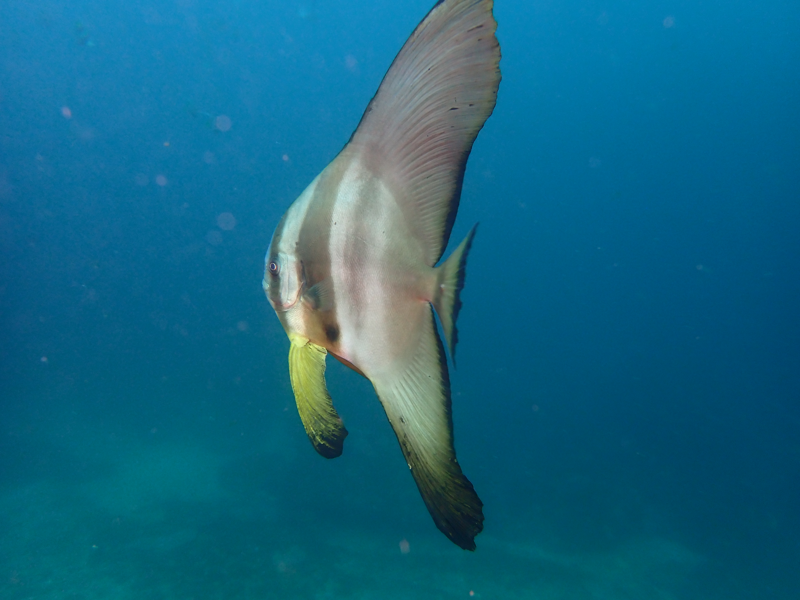

In [95]:
img = Image.open(filename)
resized_img = img.resize([edge // 5 for edge in img.size])
resized_img

In [89]:
def get_rect(img, center_x, center_y, width, height, flatten=False):
    left = max(0, int((center_x - width / 2) * img.width))
    right = min(img.width - 1, int((center_x + width / 2) * img.width))
    top = max(0, int((center_y - height / 2) * img.height))
    bottom = min(img.height - 1, int((center_y + height / 2) * img.height))
    return (left, top, right, bottom) if flatten else ((left, top), (right, bottom))

In [91]:
[
    get_rect(img, center_x, center_y, width, height),
    get_rect(img, center_x, center_y, width, height, flatten=True),
    get_rect(resized_img, center_x, center_y, width, height),
    get_rect(resized_img, center_x, center_y, width, height, flatten=True),    
]

[((1324, 264), (2522, 2682)),
 (1324, 264, 2522, 2682),
 ((264, 52), (504, 536)),
 (264, 52, 504, 536)]

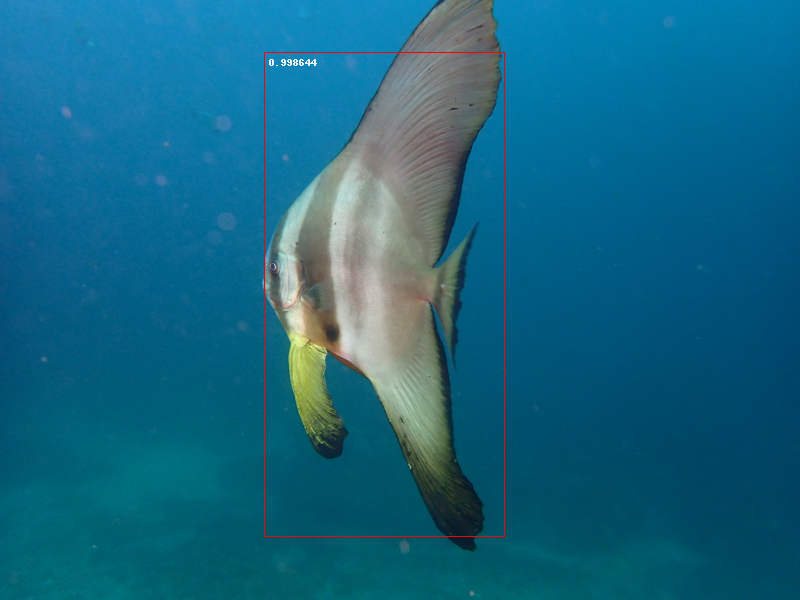

In [122]:
resized_img_copy = resized_img.copy()
img_draw = ImageDraw.Draw(resized_img_copy)
rect = get_rect(resized_img_copy, center_x, center_y, width, height)
img_draw.rectangle(rect, outline="red", width=1)
img_draw.text([x + 5 for x in rect[0]], str(confidence), fill="#eee")
resized_img_copy

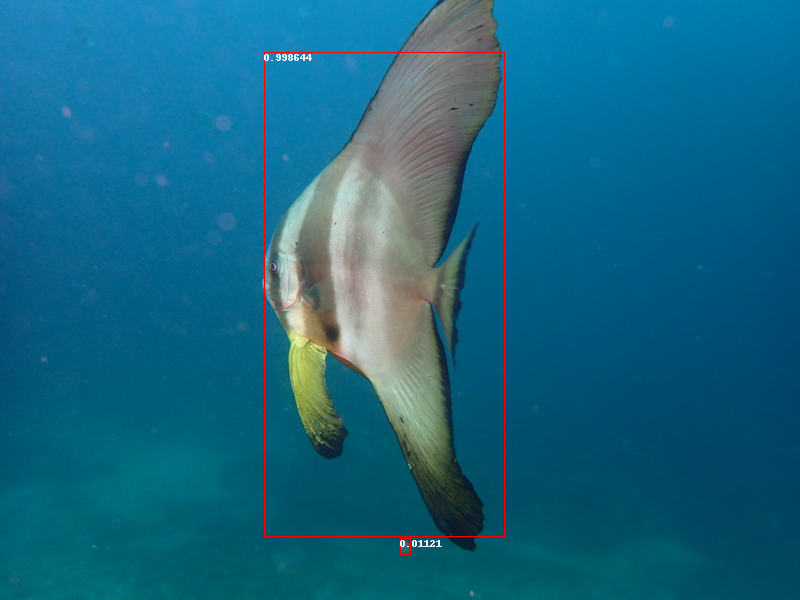

In [202]:
def draw_bboxes_for_file(bboxes, filename=None, resize_factor=5):
    if filename is None:
        filename = bboxes.sample().iloc[0].filename
    img = Image.open(filename)
    resized_img = img.resize([edge // resize_factor for edge in img.size])
    img_draw = ImageDraw.Draw(resized_img)
    for row in bboxes.query("filename == @filename").itertuples():
        rect = get_rect(resized_img, row.center_x, row.center_y, row.width, row.height)
        img_draw.rectangle(rect, outline="red", width=1)
        img_draw.text(rect[0], str(row.confidence), fill="#eee")
    return resized_img

draw_bboxes_for_file(bboxes, '/home/yanir/Desktop/P6204455.JPG')

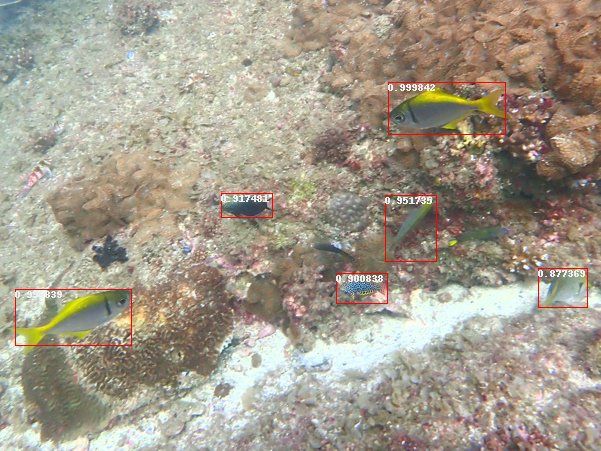

In [162]:
draw_bboxes_for_file(bboxes, '/home/yanir/Desktop/P6204469.JPG')

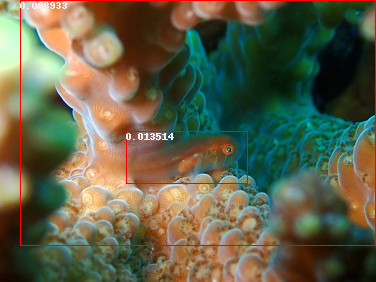

In [163]:
draw_bboxes_for_file(bboxes, '/home/yanir/Desktop/P6204485.JPG')

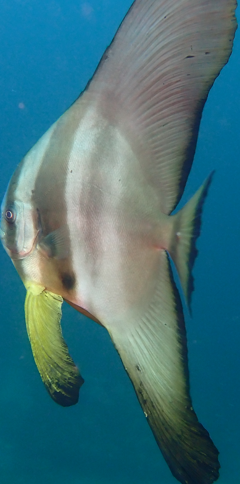

In [164]:
resized_img.crop(get_rect(resized_img, center_x, center_y, width, height, flatten=True))

In [178]:
for row in bboxes.itertuples():
    img = Image.open(row.filename)
    cropped = img.crop(get_rect(img, row.center_x, row.center_y, row.width, row.height, flatten=True))
    filename, extension = img.filename.split('.')
    with open(f'{filename}R{row.Index}.{extension}', 'wb') as cropped_fp:
        cropped.save(cropped_fp)

In [181]:
%%bash

cd ~/projects/fish_detection
ls ~/projects/deep-fish/data/eviota-202010/*.jpg | \
    ./darknet/darknet detector test \
        data-fish/obj.data yolov3-obj.cfg yolov3-obj_30000.weights \
        -thresh 0.01 -i 0 -ext_output -dont_show -out ~/projects/deep-fish/data/eviota-202010-yolov3-results.json

net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
Create CUDA-stream - 0 

 seen 64, trained: 1920 K-images (30 Kilo-batches_64) 
Enter Image Path:  Detection layer: 82 - type = 28 
 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/home/yanir/projects/deep-fish/data/eviota-202010/PA141219-chelidonura-inornata.jpg: Predicted in 189.271000 milli-seconds.
fish: 11%	(left_x: 1596   top_y: 1294   width:  620   height:  354)
Enter Image Path:  Detection layer: 82 - type = 28 
 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/home/yanir/projects/deep-fish/data/eviota-202010/PA141223-fusigobius-duospilus.jpg: Predicted in 49.130000 milli-seconds.
Enter Image Path:  Detection layer: 82 - type = 28 
 Detection layer: 94 - type = 28 
 Detection layer: 106 - type = 28 
/home/yanir/projects/deep-fish/data/eviota-202010/PA141225-fusigobius-duospilus.jpg: Predicted in 48.861000 milli-seconds.
fish: 1%	(left_x:   -0   top_y:  560  

 CUDA-version: 10010 (11020), GPU count: 1  
 OpenCV version: 4.2.0
Cannot load image data/labels/32_0.png
Cannot load image data/labels/33_0.png
Cannot load image data/labels/34_0.png
Cannot load image data/labels/35_0.png
Cannot load image data/labels/36_0.png
Cannot load image data/labels/37_0.png
Cannot load image data/labels/38_0.png
Cannot load image data/labels/39_0.png
Cannot load image data/labels/40_0.png
Cannot load image data/labels/41_0.png
Cannot load image data/labels/42_0.png
Cannot load image data/labels/43_0.png
Cannot load image data/labels/44_0.png
Cannot load image data/labels/45_0.png
Cannot load image data/labels/46_0.png
Cannot load image data/labels/47_0.png
Cannot load image data/labels/48_0.png
Cannot load image data/labels/49_0.png
Cannot load image data/labels/50_0.png
Cannot load image data/labels/51_0.png
Cannot load image data/labels/52_0.png
Cannot load image data/labels/53_0.png
Cannot load image data/labels/54_0.png
Cannot load image data/labels/55_0.

In [184]:
eviota_bboxes = read_results_from_json('/home/yanir/projects/deep-fish/data/eviota-202010-yolov3-results.json')
eviota_bboxes.head()

,filename,confidence,center_x,center_y,width,height
0,/home/yanir/projects/deep-fish/data/eviota-202...,0.114691,0.476501,0.490419,0.155122,0.117873
1,/home/yanir/projects/deep-fish/data/eviota-202...,0.071381,0.365904,0.781957,0.137059,0.306045
2,/home/yanir/projects/deep-fish/data/eviota-202...,0.042378,0.005843,0.949219,0.009950,0.048025
3,/home/yanir/projects/deep-fish/data/eviota-202...,0.030232,0.017696,0.750963,0.031221,0.213963
4,/home/yanir/projects/deep-fish/data/eviota-202...,0.021583,0.012252,0.759293,0.022015,0.125347


In [215]:
mid_confidence_eviota_boxes = eviota_bboxes.query("confidence > 0.5")
high_confidence_eviota_boxes = eviota_bboxes.query("confidence > 0.9")

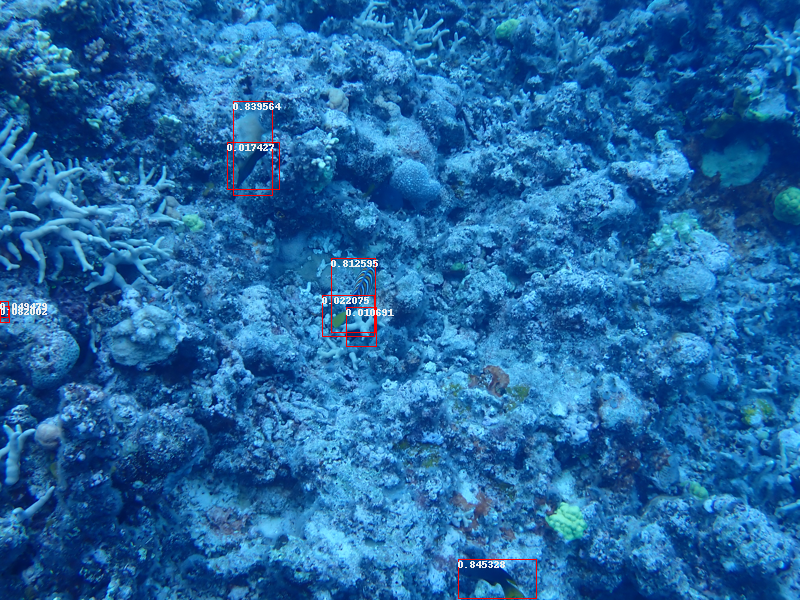

In [214]:
draw_bboxes_for_file(eviota_bboxes)

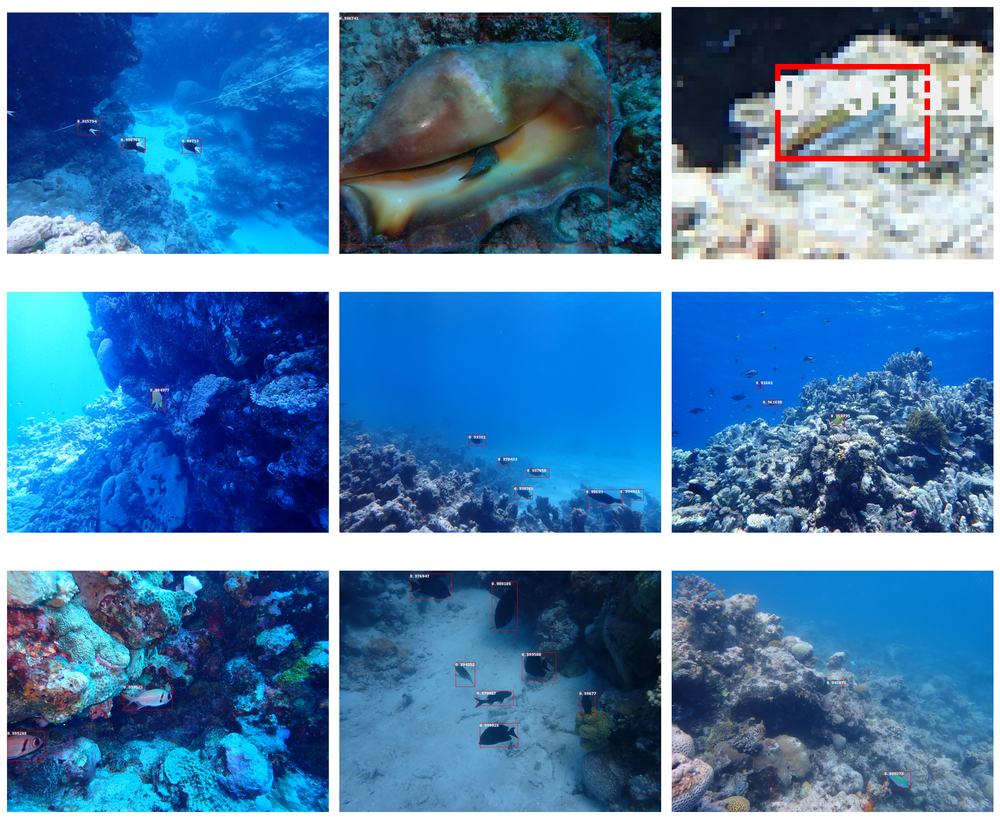

In [216]:
sample = [draw_bboxes_for_file(high_confidence_eviota_boxes) for _ in range(9)]
for ax, img in zip(plt.subplots(3, 3, figsize=(14, 12))[1].flatten(), sample):
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()

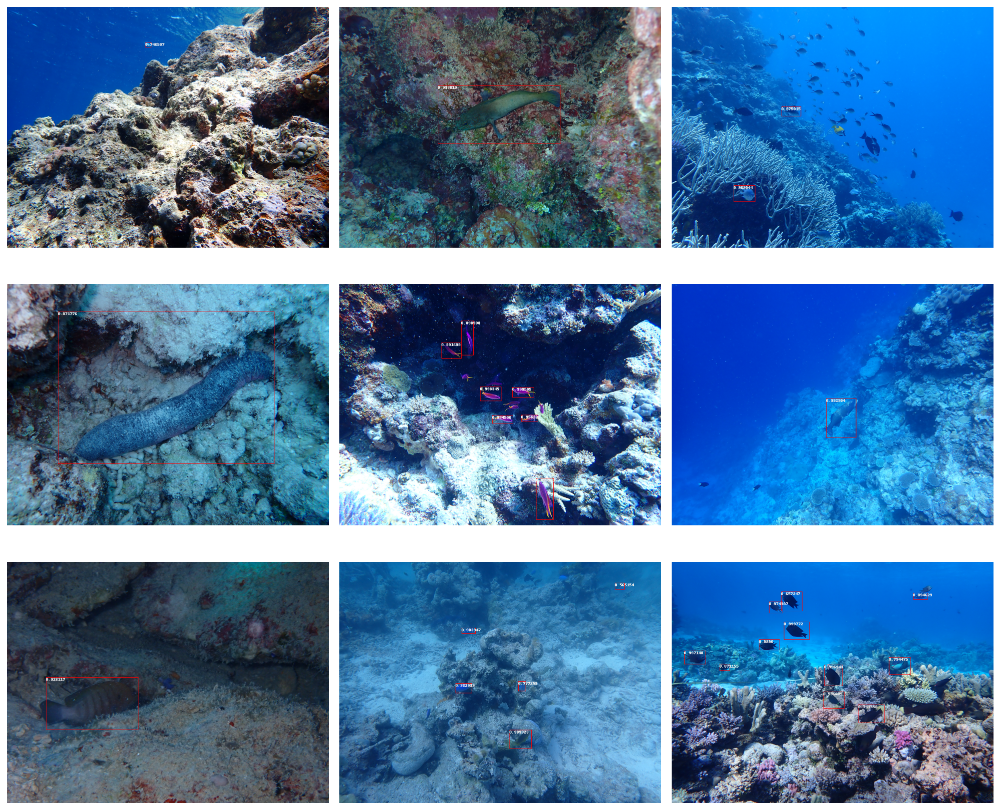

In [217]:
sample = [draw_bboxes_for_file(mid_confidence_eviota_boxes) for _ in range(9)]
for ax, img in zip(plt.subplots(3, 3, figsize=(14, 12))[1].flatten(), sample):
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()